# Prepare Kaggle environment

In [1]:
from kaggle_environments import make, utils

env = make("connectx", debug=True)

Loading environment football failed: No module named 'gfootball'


In [2]:
print(env.configuration)

{'episodeSteps': 1000, 'actTimeout': 2, 'runTimeout': 1200, 'columns': 7, 'rows': 6, 'inarow': 4, 'agentTimeout': 60, 'timeout': 2}


In [3]:
trainer = env.train([None, "random"])
state = trainer.reset()
print(f"board: {state.board}\n"\
      f"mark: {state.mark}")

while not env.done:
    state, reward, done, info = trainer.step(2)
    print(f"reward: {reward}, done: {done}, info: {info}")
    board = state.board
env.render(mode="ipython", width=350, height=300)

board: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
mark: 1
reward: 0, done: False, info: {}
reward: 0, done: False, info: {}
reward: 0, done: False, info: {}
reward: 1, done: True, info: {}


# Prepare Gym custom env of ConnectX

In [104]:
import gym
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

class ConnectXEnv(gym.Env):
    
    def __init__(self, env, policy="negamax"):
        super(ConnectXEnv, self).__init__()
        self.env = env
        self.trainer = self.env.train([None, policy])

        # アクション数定義
        ACTION_NUM = env.configuration["columns"]
        self.action_space = gym.spaces.Discrete(ACTION_NUM)

        # 状態の範囲を定義
        self.WIDTH = env.configuration["columns"]
        self.HEIGHT = env.configuration["rows"]
        
        self.obs_shape = [self.HEIGHT, self.WIDTH, 3] # treat as image
        self.observation_space = gym.spaces.Box(low=0, high=255, shape=self.obs_shape, dtype=np.uint8)
        
        self.num_envs = 1
        self.reset()

    def reset(self):
        state = self.trainer.reset()
        self.board = state["board"]
        self.mark = state["mark"]
        self.done = False
        self.boardImg = self.board2img(self.board)
        
        self.step_num = 1
        
        return self.boardImg

    def step(self, action):
        action = int(action) # added this row in order to avoid error like "Invalid Action: 4 is not of type 'integer'"
        state, reward, done, info = self.trainer.step(action)
        self.step_num += 1
        
        self.board = state["board"]
        self.boardImg = self.board2img(self.board)
        self.reward = -1 if reward==None else reward
        self.done = done

        return self.boardImg, self.reward, self.done, info

    def render(self, **kwargs):
        self.env.render(**kwargs)
        
    def board2img(self, board):
        tmp = np.array(board).reshape(self.obs_shape[:2])
        boardImg = np.zeros(self.obs_shape, dtype=np.uint8)
        boardImg[:,:,0] = np.array(tmp==self.mark)*255 # ch.0 : own mark
        boardImg[:,:,1] = np.array(tmp==(3-self.mark))*255 # ch.1 : oponent mark
        return boardImg
    
    def boardshow(self, verbose=0):
        plt.figure(figsize=(2,2))
        plt.imshow(self.boardImg)
        if verbose:
            print("red : own piece")
            print("green : oponent piece")

env = make("connectx", debug=True)
connectX = ConnectXEnv(env)

## Check if env can be used as same as Gym

In [105]:
from stable_baselines3.common.env_checker import check_env

check_env(connectX, True, True)

In [106]:
connectX = ConnectXEnv(env, "random")
state = connectX.reset()
while not connectX.done:
    state, reward, done, info = connectX.step(0)
    print(f"reward: {reward}, done: {done}, info: {info}")
connectX.render(mode="ipython", width=350, height=300)

reward: 0, done: False, info: {}
reward: 0, done: False, info: {}
reward: 0, done: False, info: {}
reward: 1, done: True, info: {}


red : own mark
green : oponent mark


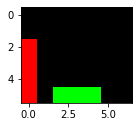

In [107]:
connectX.boardshow(verbose=1)

# Setup stable-baselines3

In [108]:
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import DummyVecEnv

env = make("connectx", debug=False)
env = ConnectXEnv(env, policy="negamax")
env = DummyVecEnv([lambda: env])

model = PPO("MlpPolicy", env, verbose=0)
model.learn(total_timesteps=1)

KeyboardInterrupt: 

In [109]:
print(model.num_timesteps)
model.num_timesteps < 1

42


False

In [ ]:
state = connectX.reset()
while not connectX.done:
    action, _states = model.predict(state, deterministic=True)
    state, reward, done, info = connectX.step(action)
    print(f"reward: {reward}, done: {done}, info: {info}")
connectX.render(mode="ipython", width=350, height=300)

In [263]:
state = connectX.reset()
while not connectX.done:
    action, _states = model.predict(state, deterministic=True)
    state, reward, done, info = connectX.step(action)
    print(f"reward: {reward}, done: {done}, info: {info}")
connectX.render(mode="ipython", width=350, height=300)

reward: 0, done: False, info: {}
reward: 0, done: False, info: {}
reward: 0, done: False, info: {}
reward: 0, done: False, info: {}
reward: 0, done: False, info: {}
reward: 0, done: False, info: {}
Invalid Action: Invalid column: 4
reward: -1, done: True, info: {}
